# Searching with Style

In this notebook, we'll explore how to use deep learning and vector search to find artwork in similar styles.

What is the style of an artwork? There are a variety of definitions of varying rigor and specificity. They include time period (Gothic vs Renaissance), medium (oil painting vs digital art), message (e.g. social realism), and so on.

For our purposes, we'll define the style of an image as the manner in which the image's content is expressed.

In [1]:
import json
from pathlib import Path

import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torchvision.models as models
import torchvision.transforms as transforms
from torchvision.datasets.folder import pil_loader
from PIL import Image

import matplotlib.pyplot as plt
import matplotlib as mpl
from tqdm import tqdm

import util
import os

In [12]:
# Set device to cuda if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [13]:
!nvidia-smi
print("PyTorch version:", torch.__version__)
print("Using device:", device)
print("Current working direcotry:", Path.cwd())
assert 'cuda' in str(device)

Sun Aug  6 02:24:21 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 515.105.01   Driver Version: 515.105.01   CUDA Version: 11.7     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA GeForce ...  Off  | 00000000:07:00.0 Off |                  N/A |
|  0%   45C    P8    22W / 420W |    383MiB / 24576MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

PyTorch version: 1.13.1+cu117
Using device: cuda
Current working direcotry: /workspaces/searching-with-style/code


In [14]:
# Make everything deterministic
torch.manual_seed(51)
np.random.seed(51)

In [15]:
# Make matplotlib look nice
mpl.rcParams['figure.figsize'] = (10,10)
mpl.rcParams['axes.titlesize'] = 24
mpl.rcParams['axes.labelsize'] = 20
mpl.rcParams['axes.titlesize'] = 24
mpl.rcParams['axes.labelsize'] = 20
mpl.rcParams['xtick.labelsize'] = 16
mpl.rcParams['ytick.labelsize'] = 16
mpl.rcParams['legend.fontsize'] = 16

In [16]:
# Images for testing
images_path = Path.cwd() / "images"
starry_night_path = images_path / "Starry-Night-canvas-Vincent-van-Gogh-New-1889.jpg"
leonardo_shoulder_path = images_path / "leonardo_da_vinci_anatomical_studies_of_the_shoulder.png"
golden_gate_path = images_path / "GoldenGateBridge-001.jpg"

# Paths to datasets
best_artworks_dataset_path = Path.cwd() / "best_artwork" / "images"
wikiart_dataset_path = Path.cwd() / "wikiart"

# Model weights
style_reduction_model_path = Path.cwd() / "pretrained_models" / "style_reduction_model-5.pt"
content_reduction_model_path = Path.cwd() / "pretrained_models" / "content_reduction_model-3.pt"

## VGG19 and Feature maps

![VGG19 Architecture](images/vgg19.png "VGG19 Architecture")

Feature maps are 2D arrays of values produced by the convolutional layers of the network. Each convolutional layer has some number of feature detectors. Each feature detector scans the input to the convolutioal layer and produces a new feature map.

We can think of the input image as consisting of 3 feature maps, one for red pixel values, blue pixel values, and green pixel values. For example, take this image of Starry Night by Vincent van Gogh:

<div style="text-align:center">
<img src="images/Starry-Night-canvas-Vincent-van-Gogh-New-1889.jpg" 
     alt="Starry Night" 
     width="450" />
</div>

here are the initial feature maps for Starry Night, one for each color channel:

![Starry Night color channels](images/snfm_input.png)

Here is what we get after the above inputs passes through the first convolutional layer (conv1_1):

![feature maps conv1_1](images/snfm_conv1_1.png)

And the the second convolutional layer (conv1_2):

![feature maps conv1_2](images/snfm_conv1_2.png)

As we progress through the network, the feature maps become smaller and more numerous. They also become more abstract. Here are the feature maps for the seventh convolutional layer (conv3_3):

![feature maps conv3_3](images/snfm_conv3_3.png)

PyTorch comes with a pretrained VGG19 network. Here we are just wrapping the implementation to make it easier to extract the intermediate feature maps:

In [17]:
class VGG19FeaturesModel(torch.nn.Module):
    def __init__(self, vgg=None):
        super(VGG19FeaturesModel, self).__init__()
        if vgg is None:
            vgg = models.vgg19(pretrained=True)
        self.vgg = vgg

        # Build mapping from sensible names to layers
        features_crap_name_to_sensible = {}
        channel_count = {}
        block = 1
        conv_count = 0
        num_channels = 0
        for name, layer in self.vgg.features._modules.items():
            if isinstance(layer, torch.nn.Conv2d):
                conv_count += 1
                num_channels = layer.out_channels
                sensible_name = f"conv{block}_{conv_count}"
            elif isinstance(layer, torch.nn.ReLU):
                pass
            elif isinstance(layer, torch.nn.MaxPool2d):
                sensible_name = f"maxpool{block}"
                block += 1
                conv_count = 0
            else:
                raise RuntimeError(f"Unexpected layer type: {layer}")
            features_crap_name_to_sensible[name] = sensible_name
            channel_count[sensible_name] = num_channels
        
        self.channel_count = channel_count
        self.features_crap_name_to_sensible = features_crap_name_to_sensible

        classifier_crap_name_to_sensible = {}
        linear_count = 0
        for name, layer in self.vgg.classifier._modules.items():
            if isinstance(layer, torch.nn.Linear):
                linear_count += 1
                classifier_crap_name_to_sensible[name] = f"fc_linear{linear_count}"
            elif isinstance(layer, torch.nn.ReLU):
                pass
            elif isinstance(layer, torch.nn.Dropout):
                pass
            else:
                raise RuntimeError(f"Unexpected layer type: {layer}")
        
        self.classifier_crap_name_to_sensible = classifier_crap_name_to_sensible

    def forward(self, x):
        features = {}
        for name, layer in self.vgg.features._modules.items():
            x = layer(x)
            if name in self.features_crap_name_to_sensible:
                features[self.features_crap_name_to_sensible[name]] = x
        x = self.vgg.avgpool(x)
        features['avgpool'] = x
        x = torch.flatten(x, 1)
        for name, layer in self.vgg.classifier._modules.items():
            x = layer(x)
            if name in self.classifier_crap_name_to_sensible:
                features[self.classifier_crap_name_to_sensible[name]] = x

        return features


vgg = VGG19FeaturesModel().to(device).eval()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [18]:
# Preprocessing transformations for input images
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

## Style vectors

The mean and standard deviation of these feature maps encodes, in some sense, the style of the image. We can construct a style vector by taking the mean and standard deviation of a subset of the feature maps. Typically, when doing style transfer, the contribution of each convolutional layer is normalized by the number of feature maps in that layer. This is to prevent later layers, with substantially more feature maps, from dominating the loss. Also, early layers tend to be weighted more heavily than later layers. However, since we want to be able to search using these vectors, we have to account for these factors in the vectors themselves, not in the loss function.

In [19]:
# Layers of VGG19 to use for our style vectors and how much to weight them
# It is common to weight earlier layers more than later layers
style_weights = {
    'conv1_1': 1.0, 
    'conv2_1': 1.0,
    'conv3_1': 1.0,
    'conv4_1': 1.0,
    'conv5_1': 1.0
}

# Note: Python dicts are ordered in Python 3.7+
style_layers = tuple(style_weights.keys())

# Get raw features size (we need the mean and std for each channel, so total channels times 2)
raw_style_vector_size = 2 * sum(vgg.channel_count[layer] for layer in style_layers)

In [20]:
def extract_style_vector(features):
    components = []
    for layer, weight in style_weights.items():
        feature = features[layer]
        feature_map_count = feature.shape[1]
        u = feature.mean(dim=[2,3])
        std = feature.std(dim=[2,3])

        # Adjust u and std so that each layer contributes the same amount to
        # the style vector. This is important as if we don't do this, then
        # later layers with more channels will have an outsized impact on the
        # distance between two style vectors.
        u = u / np.sqrt(feature_map_count)
        std = std / np.sqrt(feature_map_count)

        # Weight each layer by the style weight. Now that we've equalized the
        # contribution of each layer, we can adjust the contribution based on
        # the specified weight.
        u = u * np.sqrt(weight)
        std = std * np.sqrt(weight)

        components.append(u)
        components.append(std)
    vector = torch.cat(components, dim=1)
    return vector

## Style Transfer Example

The goal of style transfer is to take a content image and a style image and produce a new image that has the content of the content image and the style of the style image. There are many ways to do this, using Apatptive Instance Normalization for example, but we will do it the old fashion way: using backprogation to generate an image. We do this by minimizing a loss function that has two components: a content loss and a style loss. By adjusting the pixel values of the generated image to minimize these losses, we should end up with an image that has the content of the content image and the style of the style image.

For this example, we will use Starry Night as our style image, and a photo of the Golden Gate Bridge for our content image.

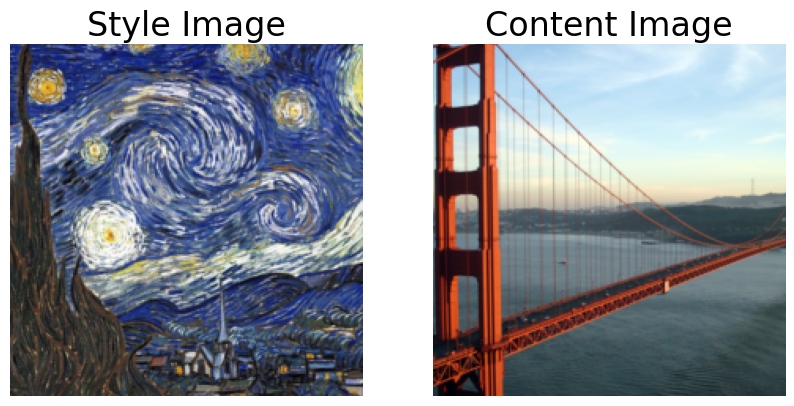

In [35]:
style_img = preprocess(Image.open(starry_night_path)).unsqueeze(0)
content_img = preprocess(Image.open(golden_gate_path)).unsqueeze(0)

util.display_img_row(style_img, content_img, titles=['Style Image', 'Content Image'])

We have the style vector to represent the style of our style image. However, we need something to represent the content of our content image. For this task, we can use the feature maps of one of the later layers in the network. The reason for using a later layer is that these layers tend to be less dependent on the exact pixel values of the image, allowing greater flexibility for the style image to influence the generated image.

In [21]:
def extract_content_vector(features):
    x = features['conv4_2']
    samples = x.shape[0]
    
    # Flatten the feature map
    return x.view(samples, -1)

Step: 0, Loss: 109.83516693115234 0.005491758231073618 0.0


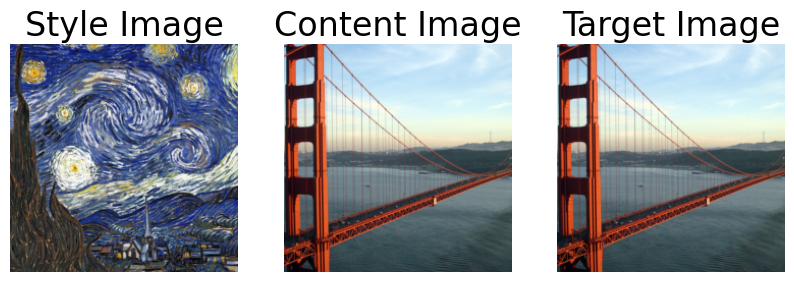

Step: 10000, Loss: 7.606464862823486 6.20124556007795e-05 6.366215705871582


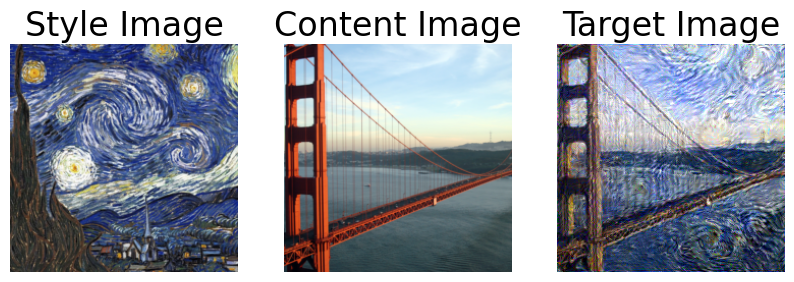

In [13]:
# Weight for style loss
# Generally this is quite a bit higher than the content_weight
style_weight = 20 * 1e3

# Weight for content loss
content_weight = 1.0

# Learning rate for Adam optimizer
lr = 0.003

# Number of iterations to run
num_iters = 10_000

# Target image is the one that will have content of the content image and the style of the style image
# It is common (but not required) to initialize the target image with the content image
target_img = content_img.clone().to(device).requires_grad_(True)

# Get the features of the style and content images
with torch.no_grad():
    style_vector = extract_style_vector(vgg(style_img.to(device)))
    content_vector = extract_content_vector(vgg(content_img.to(device)))

optimizer = optim.Adam([target_img], lr=lr)

for step in range(num_iters+1):
    target_features = vgg(target_img)
    target_content_vector = extract_content_vector(target_features)
    target_style_vector = extract_style_vector(target_features)
    
    style_loss = F.mse_loss(target_style_vector, style_vector)
    content_loss = F.mse_loss(target_content_vector, content_vector)
    loss = style_weight*style_loss + content_weight*content_loss
    
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    
    if step % num_iters == 0:
        print(f'Step: {step}, Loss: {loss.item()} {style_loss.item()} {content_loss.item()}')
        # Show the image
        util.display_img_row(style_img, content_img, target_img, titles=['Style Image', 'Content Image', 'Target Image'])

## Searching with Style

We saw above that the style vector, in some sense, encodes the style of an image, and we were able to successfully use it to perform style transfer. Now we want to see if these vectors can be used to find images that are in a similar style. Do the distances between the vectors correspond to our intuitive notions of style similarity? Lets find out.

First, we need a dataset. To start with, we will use this [Best Artworks of All Time](https://www.kaggle.com/datasets/ikarus777/best-artworks-of-all-time) I found on Kaggle.com. That's not my name for the dataset, I'm not making any claims about the quality of the art. I just needed a dataset of artwork.

Dataset size: 8,774
Number of artists: 51

image_path: /workspaces/searching-with-style/code/best_artwork/images/Albrecht_DuтХа├кrer/Albrecht_DuтХа├кrer_1.jpg


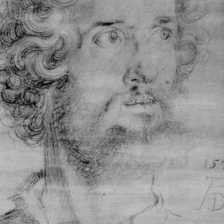

In [22]:
# The use of "best" here comes from the dataset's name. I'm not judging the art.
ds = util.BestArtDataset(root=best_artworks_dataset_path, transform=preprocess)
print(f"Dataset size: {len(ds):,}")
print(f"Number of artists: {len(ds.classes):,}")
print()

# Display example from dataset
img, image_path, target = ds[0]
print(f"image_path: {image_path}")
util.tensor2im(img)

We aren't quite ready to throw this all into Astra Vector Search just yet. In the interim, we will use a simple brute force search. We will compute the style vector for each image in the dataset, and then search for the images with the smallest distance to our target style vector. For this we define the `VectorStore` class below. This will also be useful later for evaluating the performance of Astra Vector Search.

In [23]:
class VectorStore:
    def __init__(self):
        self.data = {}

    def add_vector(self, key, vector, value=None):
        self.data[key] = (vector, value)
    
    @torch.no_grad()
    def find_nearest(self, query_vector, k):
        if len(query_vector.shape) == 1:
            query_vector = query_vector.unsqueeze(0)

        top_k = []
        for key, (vector, value) in self.data.items():
            if len(vector.shape) == 1:
                vector = vector.unsqueeze(0)
            distance = F.cosine_similarity(query_vector, vector)
            top_k.append((distance, key, vector, value))
            top_k.sort(key=lambda x: x[0], reverse=True)
            while len(top_k) > k:
                top_k.pop()
        return top_k
    
    def __getitem__(self, key):
        return self.data[key]
    
    def __len__(self):
        return len(self.data)

In [24]:
def populate_vectorstore_from_bestartdataset(vs, ds, embedding_extractor):
    for imgs, filenames, _ in tqdm(torch.utils.data.DataLoader(ds, batch_size=100, shuffle=False)):
        # filename is of the form <first>_<last>/<first>_<last>_<number>.jpg
        artist_names = [filename.split('/')[-2].replace('_', ' ') for filename in filenames]
        image_paths = [best_artworks_dataset_path / filename for filename in filenames]

        with torch.no_grad():
            features = vgg(imgs.to(device))
            style_vectors = embedding_extractor(features)
            style_vectors = style_vectors.detach().cpu()

        for filename, artist_name, image_path, style_vector in zip(filenames, artist_names, image_paths, style_vectors):
            value = {'artist_name': artist_name, 'image_path': image_path}
            vs.add_vector(filename, style_vector, value)

In [15]:
ds_style_vector_store = VectorStore()
populate_vectorstore_from_bestartdataset(
    ds_style_vector_store, 
    ds, 
    embedding_extractor=extract_style_vector
)

100%|██████████| 88/88 [01:14<00:00,  1.17it/s]


Using the `VectorStore` we can both retrieve the vector for a sample using its key (in this case, the image filename) and search for the top k nearest neighbors for a vector.

In [16]:
sample_key = ds.samples[800][0]
sample_style_vector, _ = ds_style_vector_store[sample_key]
nearest_neighbors = ds_style_vector_store.find_nearest(sample_style_vector, k=2)

print("Sample key:", Path(sample_key).name)
print("style vector shape:", sample_style_vector.shape)
print("Top 2 nearest neighbor:", [Path(nn[1]).name for nn in nearest_neighbors])

Sample key: Alfred_Sisley_229.jpg
style vector shape: torch.Size([2944])
Top 2 nearest neighbor: ['Alfred_Sisley_229.jpg', 'Alfred_Sisley_41.jpg']


The following code puts it all together, allowing us to take an image, find all he images with a similar style in the dataset and display them.

In [17]:
@torch.no_grad()
def search(vs, query_img, limit=10, embedding_extractor=None, device=device):
    # Set style_extractor function if not set
    if embedding_extractor is None:
        embedding_extractor = extract_style_vector

    # Check if query_img is path-like
    if isinstance(query_img, str) or isinstance(query_img, Path):
        # Load the image
        query_img = Image.open(query_img)
    
    # Check if PIL Image
    if isinstance(query_img, Image.Image):
        query_img = query_img.convert('RGB')
        query_img = preprocess(query_img)
    
    # Add batch dimension if missing
    if len(query_img.shape) == 3:
        query_img = query_img.unsqueeze(0)
    
    query_img = query_img.to(device)
    
    features = vgg(query_img)
    embedding = embedding_extractor(features).detach().to('cpu')
    return query_img, vs.find_nearest(embedding, k=limit)

In [18]:
def display_results(query_img, results):
    number_rows = len(results) + 1
    fig, ax = plt.subplots(number_rows, 2, figsize=(10, number_rows*6))
    ax[0, 0].imshow(util.tensor2im(query_img))
    ax[0, 0].axis('off')
    ax[0, 1].text(0, 0.5, 'Query Image', fontsize=20)
    ax[0, 1].axis('off')

    for i, (distance, _, _, value) in enumerate(results):
        image_path = value['image_path']
        artist_name = value["artist_name"]
        i = i + 1
        ax[i, 0].imshow(pil_loader(image_path))
        ax[i, 0].axis('off')
        ax[i, 1].text(0, 0.5, f'Artist: {artist_name} \nDistance: {distance.item():.2f}', fontsize=20)
        ax[i, 1].axis('off')

    plt.show()

In [19]:
def search_and_display(ds, query_img, limit=10, embedding_extractor=None):
    query_img, results = search(ds, query_img, limit, embedding_extractor)
    display_results(query_img, results)

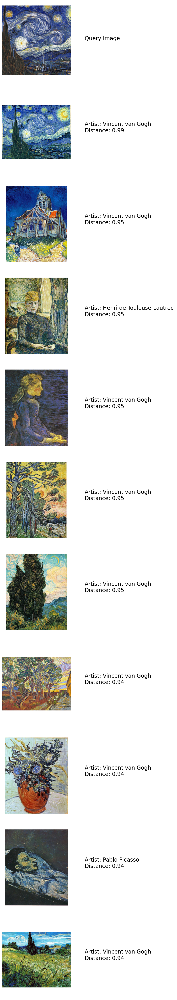

In [20]:
search_and_display(ds_style_vector_store, starry_night_path, embedding_extractor=extract_style_vector)

## Dimensionality Reduction

Our current style vectors have almost 3,000 dimensions. This is on the larger side of things. For example, ChatGPT embeddings have 1,536 dimensions. Why do we care about this? Lets look at the runtime of vector search:

$$
  (\text{number of SSTables}) \cdot (\text{vector dimensions}) \cdot log(\text{number of vectors})
$$

So runtime of a search is linear with respect to the size of the vectors. This is because to calculate the distance between to vectors takes linear times with respect to the number of dimensions.

There are mutliple ways to reduce the dimensionality of our vectors, but here we will Autoencoders. Autoencoders are a type of neural network that learns to compress data. They are composed of two parts: an encoder and a decoder. The encoder takes in the data and compresses it into a smaller representation. The decoder takes in the compressed representation and tries to reconstruct the original data. The loss function is the difference between the original data and the reconstructed data. The encoder learns to compress the data in a way that the decoder can reconstruct it.

![Autoencoder](images/autoencoder.png "Autoencoder")

Once we've trained our autoencoder, we can use the encoder to compress our style vectors. We can then use the compressed vectors to search for similar images. The runtime of the search is now linear with respect to the size of the compressed vectors, which in our case will be 512 dimensions, one sixth the size.

In [25]:
# Style vector size (what we want to compress the raw style vectors to)
style_vector_size = 512 

print(f"Current style vector size: {raw_style_vector_size:,}")
print(f"Desired style vector size: {style_vector_size:,}")

Current style vector size: 2,944
Desired style vector size: 512


In [26]:
class DimensionReductionModel(nn.Module):
    def __init__(self, input_size=raw_style_vector_size, output_size=style_vector_size):
        super(DimensionReductionModel, self).__init__()
        self.input_size = input_size
        self.output_size = output_size

        hidden_size = (output_size >> 1) + output_size

        self.linear = nn.Sequential(
            nn.Linear(input_size, hidden_size),
            nn.ReLU(),
            nn.Linear(hidden_size, output_size),
            nn.ReLU()
        )
    
    def forward(self, x):
        x = self.linear(x)
        return x


class AutoEncoderModel(nn.Module):
    def __init__(self, input_size=raw_style_vector_size, target_size=style_vector_size):
        super(AutoEncoderModel, self).__init__()
        self.input_size = input_size
        self.target_size = target_size

        self.encoder = DimensionReductionModel(
            input_size=input_size,
            output_size=target_size
        )

        hidden_size = (target_size >> 1) + target_size

        self.decoder = nn.Sequential(
            nn.Linear(target_size, hidden_size),
            nn.ReLU(),
            nn.Linear(hidden_size, input_size),
            nn.ReLU()
        )
    
    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

To train the autoencoder, we need a larger dataset to prevent overfitting. For this we use a dataset based on a [dump](https://archive.org/details/wikiart-dataset) of WikiArt.org. 

We construct our validation set by setting aside the images of 20 artists. The reason for doing the train/validation split in this way is that it better allows us to see if we are overfitting to particular styles. If we just took 10% of the images at random and set those aside as our validation set, we would not be able to tell if we were overfitting to partricular styles as the training set and validation set would likely have the same distribution of styles.

In [28]:
import importlib
importlib.reload(util)

<module 'util' from '/workspaces/searching-with-style/code/util.py'>

Train dataset size: 76,796
Validation dataset size: 4,648
Number of artists: 129

Artist: vincent-van-gogh
Style: Realism
Filename: Realism/vincent-van-gogh_pine-trees-in-the-fen-1884.jpg


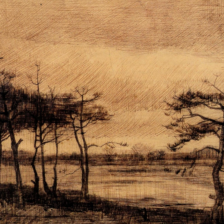

In [30]:
wikiartds = util.WikiArtDataset(root=wikiart_dataset_path, transform=preprocess)

# Validation artists
validation_artists = [
    'mstislav-dobuzhinsky', 'egon-schiele', 'gene-davis', 'hans-memling',
    'vasily-perov', 'utagawa-kuniyoshi', 'peter-paul-rubens',
    'katsushika-hokusai', 'fernando-botero', 'ernst-ludwig-kirchner',
    'anthony-van-dyck', 'raphael-kirchner', 'edward-burne-jones',
    'maurice-prendergast', 'mary-cassatt', 'paolo-veronese', 'william-turner',
    'gustav-klimt', 'jacek-malczewski', 'john-singer-sargent'
]

validation_artist_classes = [wikiartds.artist_class_to_idx[artist] for artist in validation_artists]

# Split wikiartds into train and validation
wikiartds_train = util.WikiArtDataset(root=wikiart_dataset_path, transform=preprocess)
wikiartds_train.samples = [sample for sample in wikiartds_train.samples if sample[1] not in validation_artist_classes]
wikiartds_validation = util.WikiArtDataset(root=wikiart_dataset_path, transform=preprocess)
wikiartds_validation.samples = [sample for sample in wikiartds_validation.samples if sample[1] in validation_artist_classes]

print(f"Train dataset size: {len(wikiartds_train):,}")
print(f"Validation dataset size: {len(wikiartds_validation):,}")
print(f"Number of artists: {len(wikiartds.artist_classes):,}")
print()

# Display example from dataset
img, filename, artist_idx, style_idx = wikiartds_train[0]
print("Artist:", wikiartds.artist_classes[artist_idx])
print("Style:", wikiartds.style_classes[style_idx])
print("Filename:", filename)
util.tensor2im(img)

In [24]:
# Training is slow, skip if we don't need to train
train_autoencoder = not style_reduction_model_path.exists()

if train_autoencoder:
    # Train the autoencoder on our style vectors
    model = AutoEncoderModel().to(device)
    optimizer = optim.Adam(model.parameters(), lr=0.001)

    # Create a dataloader for the style vectors
    loader_train = torch.utils.data.DataLoader(wikiartds_train, batch_size=100, shuffle=True)
    loader_validation = torch.utils.data.DataLoader(wikiartds_validation, batch_size=100, shuffle=False)

    for epoch in range(15):
        for i, value in enumerate(tqdm(loader_train)):
            img_batch = value[0].to(device)
            
            # Extract the style vectors from the batch
            with torch.no_grad():
                features = vgg(img_batch)
                y = extract_style_vector(features)
            
            # Forward pass
            y_hat = model(y)

            # Compute the loss
            loss = F.mse_loss(y_hat, y)
            
            # Backprop
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
        
        # Validate
        model.eval()
        with torch.no_grad():
            running_validation_loss = 0
            for i, value in enumerate(tqdm(loader_validation)):
                img_batch = value[0].to(device)
                
                # Extract the style vectors from the batch
                features = vgg(img_batch)
                y = extract_style_vector(features)
                
                # Forward pass
                y_hat = model(y)

                # Compute the loss
                validation_loss = (1 - F.cosine_similarity(y_hat, y)).mean()
                # validation_loss = F.mse_loss(y_hat, y)
                running_validation_loss += validation_loss.item()
                
            avg_validation_loss = running_validation_loss / len(loader_validation)
        model.train()
        print(f'Epoch: {epoch}, Loss: {loss.item()} Val Loss: {avg_validation_loss}')
    
    # Done training, save the model
    torch.save(model.encoder.to('cpu').state_dict(), style_reduction_model_path)

In [31]:
# Load the style dimension reduction model
dim_reducer = DimensionReductionModel()
dim_reducer.load_state_dict(torch.load(style_reduction_model_path))
# dim_reducer.load_state_dict(torch.load('pretrained_models/style_reduction_model-3.pt'))
dim_reducer = dim_reducer.to(device).eval()

Now that we've trained the encoder, we can create a new vector store with our compressed style vectors.

In [32]:
def extract_small_style_vector(features):
    raw_style_vector = extract_style_vector(features)
    style_vector = dim_reducer(raw_style_vector)
    return style_vector

In [27]:
ds_small_style_vector_store = VectorStore()
populate_vectorstore_from_bestartdataset(
    ds_small_style_vector_store, 
    ds, 
    embedding_extractor=extract_small_style_vector
)

100%|██████████| 88/88 [01:10<00:00,  1.24it/s]


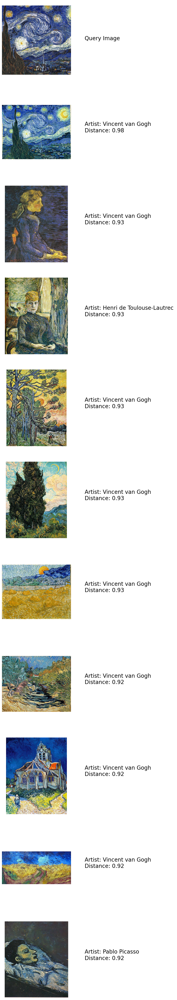

In [28]:
search_and_display(ds_small_style_vector_store, starry_night_path, embedding_extractor=extract_small_style_vector)

### Quantifying impact of compression

We can use recall at k to evaluate the quality of our compressed vectors. First, we find the top k results for each image in our dataset using both the original vectors and the compressed vectors. Then we calculate the percentage of the top k results that are the same for both the original vectors and the compressed vectors. This is the recall at k.

$$
    \text{recall@k} = \frac{\lvert (\text{top k original}) \cap (\text{top k compressed}) \rvert}{\lvert \text{top k original} \rvert}
$$

In [31]:
def populate_vectorstores_from_wikiartdataset(vs_large, vs_small, wikiartds, embedding_extractor, dim_reducer):
    for imgs, filenames, artist_idxs, _ in tqdm(torch.utils.data.DataLoader(wikiartds, batch_size=100, shuffle=False)):
        with torch.no_grad():
            features = vgg(imgs.to(device))
            large_embedding = embedding_extractor(features)
            small_embedding = dim_reducer(large_embedding)
            large_embedding = large_embedding.detach().cpu()
            small_embedding = small_embedding.detach().cpu()

        for filename, artist_idx, large_vector, small_vector in zip(filenames, artist_idxs, large_embedding, small_embedding):
            artist_name = wikiartds.artist_classes[artist_idx]
            image_path = wikiartds.root / filename
            value = {'artist_name': artist_name, 'image_path': image_path}
            vs_large.add_vector(filename, large_vector, value)
            vs_small.add_vector(filename, small_vector, value)


In [32]:
wikiart_style_vs_large = VectorStore()
wikiart_style_vs_small = VectorStore()
populate_vectorstores_from_wikiartdataset(
    wikiart_style_vs_large, 
    wikiart_style_vs_small, 
    wikiartds, 
    extract_style_vector, 
    dim_reducer
)

100%|██████████| 815/815 [21:48<00:00,  1.61s/it]


In [33]:
def compute_recall_k(query_vs, target_vs, keys_to_test, k=10, fudge_distance=0.001):
    recall_values = []
    for key in keys_to_test:
        query_vector, _ = query_vs[key]
        query_results = query_vs.find_nearest(query_vector, k=k)

        # For the target, we want to allow for some fudge distance. This is because
        # we may have results that are very close to each other, but not exactly the same,
        # and we want to count those as also being correct. Likewise, this means we need
        # to get more than the top k results from the target vector store.
        target_vector, _ = target_vs[key]
        target_results = target_vs.find_nearest(target_vector, k=k*2)

        # Distance of the kth result
        kth_distance = target_results[k-1][0]

        # Filter out results that are too far away (assume cosine similarity)
        target_results = [result for result in target_results if result[0] >= kth_distance - fudge_distance]

        # Find the intersection between the results we got from query_vs and what
        # we should have gotten
        query_result_keys = {key for _, key, _, _ in query_results}
        target_result_keys = {key for _, key, _, _ in target_results}
        intersection = query_result_keys & target_result_keys

        # Compute the recall
        recall_values.append(len(intersection) / k)

    # Return the mean recall
    return np.mean(recall_values)

In [34]:
validation_keys = [sample[0] for sample in wikiartds_validation.samples]

# shuffle validation_keys with a specific seed (but don't set the seed globally)
np.random.RandomState(1066).shuffle(validation_keys)

# We just want to test on a small subset of the validation set to save time
validation_keys = validation_keys[:50]

recall_at_10 = compute_recall_k(
    wikiart_style_vs_small,
    wikiart_style_vs_large, 
    validation_keys, 
    k=10
)

# Print recall as percentage
print(f"Recall@10: {recall_at_10*100:.2f}%")

Recall@10: 79.60%


## Might as well do it for content vectors too

The common wisdom is if you want an embedding for an image, but you don't care where things are in the image, the second to last layer (the penultimate layer) is a good one to try.

In [33]:
def extract_fc_content_vector(features):
    x = features['fc_linear2']
    return x

In [36]:
raw_content_vector_size = extract_fc_content_vector(vgg(content_img.to(device))).shape[1]
content_vector_size = 1024

print(f"Current content vector size: {raw_content_vector_size:,}")
print(f"Desired content vector size: {content_vector_size:,}")

Current content vector size: 4,096
Desired content vector size: 1,024


In [37]:
# Training is slow, skip if we don't need to train
train_content_autoencoder = not content_reduction_model_path.exists()

if train_content_autoencoder:
    # Train the autoencoder on our style vectors
    model = AutoEncoderModel(input_size=raw_content_vector_size, target_size=content_vector_size).to(device)
    optimizer = optim.Adam(model.parameters(), lr=0.001)

    # Create a dataloader for the style vectors
    loader_train = torch.utils.data.DataLoader(wikiartds_train, batch_size=100, shuffle=True)
    loader_validation = torch.utils.data.DataLoader(wikiartds_validation, batch_size=100, shuffle=False)

    for epoch in range(15):
        for i, value in enumerate(tqdm(loader_train)):
            img_batch = value[0].to(device)
            
            # Extract the style vectors from the batch
            with torch.no_grad():
                features = vgg(img_batch)
                y = extract_fc_content_vector(features)
            
            # Forward pass
            y_hat = model(y)

            # Compute the loss
            loss = F.mse_loss(y_hat, y)
            
            # Backprop
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
        
        # Validate
        model.eval()
        with torch.no_grad():
            running_validation_loss = 0
            for i, value in enumerate(tqdm(loader_validation)):
                img_batch = value[0].to(device)
                
                # Extract the style vectors from the batch
                features = vgg(img_batch)
                y = extract_fc_content_vector(features)
                
                # Forward pass
                y_hat = model(y)

                # Compute the loss
                validation_loss = F.mse_loss(y_hat, y)
                running_validation_loss += validation_loss.item()
                
            avg_validation_loss = running_validation_loss / len(loader_validation)
        model.train()
        print(f'Epoch: {epoch}, Loss: {loss.item()} Val Loss: {avg_validation_loss}')
    
    # Done training, save the model
    torch.save(model.encoder.to('cpu').state_dict(), content_reduction_model_path)

In [37]:
# Load the style dimension reduction model
content_dim_reducer = DimensionReductionModel(input_size=raw_content_vector_size, output_size=content_vector_size)
content_dim_reducer.load_state_dict(torch.load(content_reduction_model_path))
content_dim_reducer = content_dim_reducer.to(device).eval()

## Cassandra Vector Search

Some notes before we shove a bunch of vectors into Astra Vector Search.

We use the dot product instead of cosine similarity because it is faster to compute. This requires that we ensure our vectors are unit vectors (i.e. they have a magnitude of one). Why can we do this? Lets look at the definition of the dot product:

$$
    \vec{a} \cdot \vec{b} = \lvert \vec{a} \rvert \lvert \vec{b} \rvert \cos(\theta)
$$

So if $\vec{a}$ and $\vec{b}$ are unit vectors, we have:

$$
    \vec{a} \cdot \vec{b} = \cos(\theta)
$$

So the dot product of two unit vectors is equal to the cosine of the angle between them. However, we must make sure we normalize our vectors appropriately... or we will get some perplexing results.


In [38]:
from cassandra.cluster import Cluster
from cassandra.auth import PlainTextAuthProvider
from cassandra.query import BatchStatement, SimpleStatement
from cassandra import ConsistencyLevel
from cassandra import ReadTimeout
from string import Template

In [40]:
ASTRA_CLIENT_ID = os.getenv('ASTRA_CLIENT_ID')
ASTRA_CLIENT_SECRET = os.getenv('ASTRA_CLIENT_SECRET')
ASTRA_SCB_PATH = util.find_scb_path(os.getenv('ASTRA_SCB_FILENAME'))

In [41]:
auth_provider = PlainTextAuthProvider(ASTRA_CLIENT_ID, ASTRA_CLIENT_SECRET)
cluster = Cluster(cloud=dict(secure_connect_bundle=ASTRA_SCB_PATH), auth_provider=auth_provider)
session = cluster.connect()
session.default_timeout = 120

In [42]:
from string import Template

keyspace = 'style_search'
style_table = 'artwork_style'
content_table = "artwork_content"

create_table_template = '''
CREATE TABLE IF NOT EXISTS ${keyspace}.${table_name} (
    filename TEXT PRIMARY KEY,
    artist TEXT,
    movement TEXT,
    embedding VECTOR<FLOAT, ${dimensions}>,
    embedding_reduced VECTOR<FLOAT, ${dimensions_reduced}>
);
'''

existing_tables_query = '''
SELECT table_name FROM system_schema.tables WHERE keyspace_name=%(keyspace)s;
'''

create_index_template = '''
CREATE CUSTOM INDEX IF NOT EXISTS ${index_name} ON ${keyspace}.${table_name}(${column_name}) USING 'StorageAttachedIndex' WITH OPTIONS = { 'similarity_function': '${comparison_type}' };
'''

query_result = session.execute(existing_tables_query, {'keyspace': keyspace})
existing_tables = set(row.table_name for row in query_result)

for table_name, dimensions, dimensions_reduced, index_full_embedding, comparison_type in [
    (style_table, raw_style_vector_size, style_vector_size, True, 'dot_product'),
    (content_table, raw_content_vector_size, content_vector_size, False, 'dot_product'),
]:
    # Create the table
    print("Creating table:", table_name)
    create_table_query = Template(create_table_template).substitute(
        keyspace=keyspace,
        table_name=table_name,
        dimensions=dimensions,
        dimensions_reduced=dimensions_reduced,
    )

    print("Executing query:", create_table_query)
    session.execute(
        create_table_query
    )

    # Create index for reduced embedding
    reduced_index_name = f"{table_name}_reduced_ann_index"
    print("Creating index:", reduced_index_name)
    create_reduced_index_query = Template(create_index_template).substitute(
        {
            'keyspace': keyspace,
            'table_name': table_name,
            'comparison_type': comparison_type,
            'index_name': f"{table_name}_reduced_ann_index",
            'column_name': 'embedding_reduced'
        }
    )

    print("Executing query:", create_reduced_index_query)
    session.execute(
        create_reduced_index_query
    )

    if index_full_embedding:
        # Create index for full embedding
        full_index_name = f"{table_name}_full_ann_index"
        print("Creating index:", full_index_name)
        create_full_index_query = Template(create_index_template).substitute(
            {
                'keyspace': keyspace,
                'table_name': table_name,
                'comparison_type': comparison_type,
                'index_name': f"{table_name}_full_ann_index",
                'column_name': 'embedding'
            }
        )

        print("Executing query:", create_full_index_query)
        session.execute(
            create_full_index_query
        )
    

Creating table: artwork_style
Executing query: 
CREATE TABLE IF NOT EXISTS style_search.artwork_style (
    filename TEXT PRIMARY KEY,
    artist TEXT,
    movement TEXT,
    embedding VECTOR<FLOAT, 2944>,
    embedding_reduced VECTOR<FLOAT, 512>
);

Creating index: artwork_style_reduced_ann_index
Executing query: 
CREATE CUSTOM INDEX IF NOT EXISTS artwork_style_reduced_ann_index ON style_search.artwork_style(embedding_reduced) USING 'StorageAttachedIndex' WITH OPTIONS = { 'similarity_function': 'dot_product' };

Creating index: artwork_style_full_ann_index
Executing query: 
CREATE CUSTOM INDEX IF NOT EXISTS artwork_style_full_ann_index ON style_search.artwork_style(embedding) USING 'StorageAttachedIndex' WITH OPTIONS = { 'similarity_function': 'dot_product' };

Creating table: artwork_content
Executing query: 
CREATE TABLE IF NOT EXISTS style_search.artwork_content (
    filename TEXT PRIMARY KEY,
    artist TEXT,
    movement TEXT,
    embedding VECTOR<FLOAT, 4096>,
    embedding_red

In [47]:
insert_template = '''
INSERT INTO ${keyspace}.${table_name} (filename, artist, movement, embedding, embedding_reduced) VALUES (%(filename)s, %(artist)s, %(movement)s, %(embedding)s, %(embedding_reduced)s)
'''

@torch.no_grad()
def load_data():
    loader = torch.utils.data.DataLoader(wikiartds, batch_size=20, shuffle=False)
    for imgs, filenames, artist_idxs, style_idxs in tqdm(loader):
        # Our original style vector
        features = vgg(imgs.to(device))
        big_style_vectors = extract_style_vector(features)
        big_content_vectors = extract_fc_content_vector(features)

        # Our smaller 512-dimensional style vector
        small_style_vectors = dim_reducer(big_style_vectors)
        small_content_vectors = content_dim_reducer(big_content_vectors)

        # Normalize vectors
        big_content_vectors_normalized = big_content_vectors / big_content_vectors.norm(dim=1).view(-1, 1)
        big_style_vectors_normalized = big_style_vectors / big_style_vectors.norm(dim=1).view(-1, 1)
        small_style_vectors_normalized = small_style_vectors / small_style_vectors.norm(dim=1).view(-1, 1)
        small_content_vectors_normalized = small_content_vectors / small_content_vectors.norm(dim=1).view(-1, 1)

        # Guess what sort of bug I had above
        assert 0.9 < small_style_vectors_normalized[0].norm() < 1.1, "Small style vector should be of unit length"
        assert 0.9 < big_style_vectors_normalized[0].norm() < 1.1, "Big sytle vector should be of unit length"
        assert 0.9 < small_content_vectors_normalized[0].norm() < 1.1, "Small content vector should be of unit length"
        assert 0.9 < big_content_vectors_normalized[0].norm() < 1.1, "Big content vector should be of unit length"

        for table_name, embeddings, embeddings_reduced in [
                (style_table, big_style_vectors_normalized, small_style_vectors_normalized),
                (content_table, big_content_vectors_normalized, small_content_vectors_normalized),
        ]:

            insert_query = Template(insert_template).substitute(
                keyspace=keyspace,
                table_name=table_name
            )

            # Create a batch statement
            batch = BatchStatement()

            for filename, artist_idx, style_idx, embedding, embedding_reduced in zip(filenames, artist_idxs, style_idxs, embeddings, embeddings_reduced):
                artist = wikiartds.artist_classes[artist_idx]
                style = wikiartds.style_classes[style_idx]

                batch.add(
                    insert_query,
                    dict(
                        filename=filename,
                        artist=artist,
                        movement=style,
                        embedding=embedding.tolist(),
                        embedding_reduced=embedding_reduced.tolist(),
                    )
                )
                
            # Execute the batch
            util.with_retries(lambda: session.execute(batch))


In [ ]:
# load_data()

In [43]:
select_template = '''
SELECT filename, artist, movement, embedding, embedding_reduced
FROM ${keyspace}.${table_name} 
WHERE filename=%(filename)s
'''

def select_db(table_name, filename):
    select_query = Template(select_template).substitute(
        keyspace=keyspace,
        table_name=table_name
    )

    result = session.execute(
        select_query,
        dict(
            filename=filename
        )
    )
    return [row._asdict() for row in result][0]

The `query_db` function below allows us to search for a given vector based on the content or style. It also allows us to search either against the original embedding or the reduced one.

In [44]:
search_template = '''
SELECT filename, artist, movement, embedding, similarity_dot_product(${embedding_col}, %(embedding)s) as distance 
FROM ${keyspace}.${table_name} 
ORDER BY ${embedding_col} 
ANN OF %(embedding)s 
LIMIT ${limit};
'''

def query_db(embedding, table_name=style_table, reduced=True, limit=20):
    embedding_column = 'embedding_reduced' if reduced else 'embedding'

    # Make sure we actually have a list and not a tensor, you'll get a confusing SyntaxError otherwise
    if isinstance(embedding, torch.Tensor):
        # Remove batch dimension if present
        if len(embedding.shape) > 1:
            embedding = embedding.squeeze(0)
        embedding = embedding.tolist()

    query = Template(search_template).substitute(keyspace=keyspace, table_name=table_name, embedding_col=embedding_column, limit=limit)
    stmt = SimpleStatement(query, consistency_level=ConsistencyLevel.LOCAL_ONE)
    results = []
    for row in session.execute(stmt, dict(embedding=embedding)):
        result = row._asdict()
        results.append(result)

    return results

In [45]:
def warmup_db():
    """
    Warm up the database by querying it with random embeddings until it stops timing out
    """
    import time

    def gen_style_vector():
        return torch.randn(style_vector_size).tolist()
    
    def gen_content_vector():
        return torch.randn(content_vector_size).tolist()

    reads_without_timeout = 0
    while reads_without_timeout < 10:
        print(f"Reads without timeout: {reads_without_timeout}")
        for [gen_vector, table_name] in [(gen_style_vector, style_table), (gen_content_vector, content_table)]:
            try:
                query_db(gen_vector(), table_name=table_name)
                reads_without_timeout += 1
            except ReadTimeout:
                reads_without_timeout = 0

In [47]:
warmup_db()

Reads without timeout: 0
Reads without timeout: 2
Reads without timeout: 4
Reads without timeout: 6
Reads without timeout: 8


In [48]:
# Compute the style vector for our starry night image
with torch.no_grad():
    features = vgg(style_img.to(device))
    raw_style_vector = extract_style_vector(features)
    style_vector = dim_reducer(raw_style_vector)
    style_vector = style_vector / style_vector.norm()

# Query the database for images in that style
result = query_db(style_vector[0].tolist(), reduced=True)
[row['filename'] for row in result]

['Post_Impressionism/vincent-van-gogh_the-starry-night-1889(1).jpg',
 'Post_Impressionism/vincent-van-gogh_self-portrait-with-felt-hat.jpg',
 'Post_Impressionism/vincent-van-gogh_road-with-cypresses-1890.jpg',
 'Post_Impressionism/vincent-van-gogh_wheatfield-with-crows-1890.jpg',
 'Post_Impressionism/david-burliuk_fishermen.jpg',
 'Post_Impressionism/vincent-van-gogh_olive-grove-orange-sky-1889.jpg',
 'Symbolism/konstantin-bogaevsky_last-rays-1903.jpg',
 'Post_Impressionism/vincent-van-gogh_olive-grove-1889-1.jpg',
 'Post_Impressionism/vincent-van-gogh_self-portrait-as-an-artist-1888.jpg',
 'Post_Impressionism/luigi-russolo_perfume-1910.jpg',
 'Post_Impressionism/vincent-van-gogh_still-life-with-two-sunflowers-1887.jpg',
 'Expressionism/edvard-munch_the-murderess-1906.jpg',
 'Post_Impressionism/vincent-van-gogh_wheatfield-with-mountains-in-the-background-1889.jpg',
 'Naive_Art_Primitivism/marc-chagall_vitrage-at-art-institute-of-chicago-1976-1.jpg',
 'Post_Impressionism/david-burliuk_f

We wrap the `query_db` function above in a `AstraVectorStore` class with the same interface as `VectorStore`. This will allow us to reuse our code for calculating the recall at k.

In [49]:
class AstraVectorStore:
    def __init__(self, table_name, reduced, resort=False, limit=20):
        self.table_name = table_name
        self.reduced = reduced
        self.resort = resort
        self.limit = limit
    
    def __getitem__(self, key):
        result = select_db(self.table_name, key)
        embedding = result['embedding']
        embedding_tensor = torch.Tensor(embedding)
        embedding_reduced = result['embedding_reduced']
        embedding_reduced_tensor = torch.Tensor(embedding_reduced)
        return (embedding_tensor, embedding_reduced_tensor), result
    
    @torch.no_grad()
    def find_nearest(self, query_vector, k):
        # Make sure we actually have unit vectors
        embedding, embedding_reduced = query_vector
        embedding = embedding / embedding.norm()
        embedding_reduced = embedding_reduced / embedding_reduced.norm()

        query_vector = embedding_reduced if self.reduced else embedding
        results = query_db(query_vector, table_name=self.table_name, reduced=self.reduced, limit=self.limit)

        # Distances from the database are normalized to be between 0 and 1, so we
        # need to convert them back to cosine similarity which has a range of -1 to 1
        for result in results:
            result['distance'] = result['distance'] * 2 - 1

        # Resort by the original embedding
        if self.resort:
            embedding_compare = embedding.to('cpu')
            # Add batch dimension if missing
            if len(embedding_compare.shape) == 1:
                embedding_compare = embedding_compare.unsqueeze(0)

            for result in results:
                result_embedding = torch.Tensor(result['embedding']).unsqueeze(0)
                distance = F.cosine_similarity(
                    result_embedding,
                    embedding_compare,
                ).item()
                result['distance'] = distance
            results.sort(key=lambda x: x['distance'], reverse=True)

        # Convert results to a list of tuples
        results = [(result['distance'], result['filename'], query_vector, result) for result in results]

        return results[:k]

The `search_db` takes an image and a set of options passed in from our Gradio interface and returns the top 10 results in a format Gradio can understand.

In [50]:
@torch.no_grad()
def search_db(query_img, search_type='style', cheat=False, reduced=True):
    # Put image into correct format
    query_img = preprocess(query_img).unsqueeze(0)

    # Compute the style vector for our query image
    features = vgg(query_img.to(device))
    if 'content' == search_type:
        embedding = extract_fc_content_vector(features)
        embedding_reduced = content_dim_reducer(embedding)
    else:
        embedding = extract_style_vector(features)
        embedding_reduced = dim_reducer(embedding)

    # Select the correct table
    table_name = dict(content=content_table, style=style_table)[search_type]

    # Construct appropriate VectorStore
    vs = AstraVectorStore(table_name=table_name, reduced=reduced, resort=cheat, limit=20)

    # Query the database for images in that style
    results = vs.find_nearest((embedding, embedding_reduced), k=10)

    # Format results the way Gradio expects
    images_and_captions = []
    for _, _, _, result in results:
        artist = result['artist'].split('-')
        artist = [word.capitalize() for word in artist]
        artist = ' '.join(artist)

        movement = result['movement'].split('_')
        movement = [word.capitalize() for word in movement]
        movement = ' '.join(movement)

        distance = f"{result['distance']:.2f}"

        caption = f"{artist} - {movement} - {distance}"
        images_and_captions.append((str(wikiartds.root / result['filename']), caption))

    return images_and_captions

In [51]:
search_db(pil_loader(starry_night_path), search_type='style', reduced=True)

[('/workspaces/searching-with-style/code/wikiart/Post_Impressionism/vincent-van-gogh_the-starry-night-1889(1).jpg',
  'Vincent Van Gogh - Post Impressionism - 0.98'),
 ('/workspaces/searching-with-style/code/wikiart/Post_Impressionism/vincent-van-gogh_self-portrait-with-felt-hat.jpg',
  'Vincent Van Gogh - Post Impressionism - 0.95'),
 ('/workspaces/searching-with-style/code/wikiart/Post_Impressionism/vincent-van-gogh_road-with-cypresses-1890.jpg',
  'Vincent Van Gogh - Post Impressionism - 0.94'),
 ('/workspaces/searching-with-style/code/wikiart/Post_Impressionism/vincent-van-gogh_wheatfield-with-crows-1890.jpg',
  'Vincent Van Gogh - Post Impressionism - 0.94'),
 ('/workspaces/searching-with-style/code/wikiart/Post_Impressionism/david-burliuk_fishermen.jpg',
  'David Burliuk - Post Impressionism - 0.94'),
 ('/workspaces/searching-with-style/code/wikiart/Post_Impressionism/vincent-van-gogh_olive-grove-orange-sky-1889.jpg',
  'Vincent Van Gogh - Post Impressionism - 0.94'),
 ('/workspa

In [52]:
import gradio as gr

In [53]:
gr.__version__

'3.36.1'

In [54]:
gr.close_all()

demo = gr.Interface(
    fn=lambda search_type, img: search_db(
        img, 
        search_type='content' if 'content' in search_type else 'style',
        reduced='full' not in search_type,
        cheat='cheat' in search_type
    ),
    inputs=[gr.Radio(choices=['style', 'style_full', 'style_cheat', 'content', 'content_cheat'], value='reduced'), gr.Image(type="pil")],
    outputs=gr.Gallery(object_fit="cover")
)

# This is unreliable using VS Code's port forwarding, better to connect
# to the host directly via a web browser
demo.launch(
    inline=False,
    show_error=True,
    server_port=7860,
    share=False,
    # debug=True,
    server_name="0.0.0.0",
    allowed_paths=[str(wikiartds.root)]
)

Running on local URL:  http://0.0.0.0:7860

To create a public link, set `share=True` in `launch()`.


In [312]:
demo.close(verbose=True)

Closing server running on port: 7860


### Recall with vector search

Recall using the full size embeddings:

In [338]:
astra_style_vs_full = AstraVectorStore('artwork_style', reduced=False, limit=10)
recall_at_10_cfull = compute_recall_k(
    astra_style_vs_full,
    wikiart_style_vs_large,
    validation_keys,
    k=10,
    fudge_distance=0.001
)

print(f"Recall@10: {recall_at_10_cfull*100:.2f}%")

Recall@10: 100.00%


Recall using our compressed embeddings:

In [314]:
astra_style_vs_reduced = AstraVectorStore(
    'artwork_style',
    reduced=True,
    limit=10
)
recall_at_10_compressed = compute_recall_k(
    astra_style_vs_reduced,
    wikiart_style_vs_large,
    validation_keys,
    k=10,
    fudge_distance=0.001
)
print(f"Recall@10: {recall_at_10_compressed*100:.2f}%")

Recall@10: 76.20%


If we resort on the original embedding, what limit would we need in our query to get a recall of 95% for the top 10? Lets find out!

In [315]:
def find_limit(start, end, threshold, fn):
    best_result = -1
    # Do a binary search to find the limit
    while start < end:
        mid = (start + end) // 2
        # Call fn with the current limit
        result = fn(mid)
        if result > threshold:
            best_result = result
            # The result is better than the threshold, so try a lower limit
            end = mid
        else:
            start = mid + 1
    return (start, best_result)

In [316]:
def test_limit(limit):
    astra_style_vs_reduced_resort = AstraVectorStore(
        'artwork_style', 
        reduced=True,
        resort=True,
        limit=limit
    )
    return compute_recall_k(
        astra_style_vs_reduced_resort,
        wikiart_style_vs_large,
        validation_keys,
        k=10,
        fudge_distance=0.001
    )

# Find limit that achieves top 10 recall of 95%
limit, recall_at_10_95 = find_limit(start=10, end=20, threshold=0.95, fn=test_limit)

print(f"Recall@10: {recall_at_10_95*100:.2f}% when limit={limit}")

Recall@10: 95.20% when limit=18


### Search accuracy and performance

When looking at the performance of the options we've looked at, we should keep in mind the runtime formula of search we saw earlier:

$$
  (\text{number of SSTables}) \cdot (\text{vector dimensions}) \cdot log(\text{number of vectors})
$$

Here's a breakdown of the options we've looked at and their pros and cons:

1. Store only the full size embedding
    - Pros
        - best recall
    - Cons
        - slowest
        - most storage
2. Store only the compressed embedding
    - Pros
        - fastest
        - least storage
    - Cons
        - worst recall
3. Store both but only index the compressed embedding
    - Pros
        - fast
        - lower storage than (1) if compressed embeddings less than half the size of full size embeddings
        - good recall if you set the limit high enough
    - Cons
        - slower than (2)
        - more storage than (2)
        - more data needs to be sent back to the client because the client needs the original embeddings to sort on (unless the client can get them some other way) and because we might need to set the limit higher then we otherwise would to get the desired recall

Wait, why does (3) require less storage than (1)? Isn't (3) storing more stuff? The reason for this is that whichever vector column gets indexed has its values stored twice.

Keep in mind that we are performing an _approximate_ nearest neighbor search. This means that, even if we use the full size embeddings, we might want to set our limit in our queries higher to ensure we get good results.


## What have we learned?

- John can't pronounce Vincent van Gogh's name
- Vincent van Gogh sketched Starry Night before painting it
- Henri de Toulouse-Lautrec knew Vincent van Gogh and they have similar painting styles
- By using feature map statiscs, you can search for artwork in a similar style... sort of... if you squint and ignore all the bad results
- For unit vectors, the dot product and cosine are the same thing!
- Testing that your unit vectors really are unit vectors is a good idea
- Small embeddings take up less space and make searches faster
- Autoencoders can be used to compress embeddings
- It might make sense to use both compressend and uncompressed embeddings

## References

- Karen Simonyan, Andrew Zisserman. (2014). [Very Deep Convolutional Networks for Large-Scale Image Recognition](https://arxiv.org/abs/1409.1556)
- Leon A. Gatys, Alexander S. Ecker, Matthias Bethge. (2015). [A Neural Algorithm of Artistic Style](https://arxiv.org/abs/1508.06576)
- Yanghao Li, Naiyan Wang, Jiaying Liu, Xiaodi Hou. (2017). [Demystifying Neural Style Transfer](https://arxiv.org/abs/1701.01036)
- Xun Huang, Serge Belongie. (2017). [Arbitrary Style Transfer in Real-time with Adaptive Instance Normalization](https://arxiv.org/abs/1703.06868)